In [176]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm



import math
import h5py
import random

from Bio import SeqIO
import seaborn as sns


In [3]:
PUL_embeddings = []
PUL_keys = []
with h5py.File('C:\\Users\\alpha\\Documents\\jennifer\\maths\\SRIM\\code\\PUL.h5', 'r') as f:
    for key in f.keys():
      PUL_embeddings.append(f[key][()])
      PUL_keys.append(key)

In [4]:
f_path = 'C:\\Users\\alpha\\OneDrive - University of Cambridge\\BACKUP 14-04-22\\docs\\Maths\\SRIM\\code\\PUL.faa'
PUL_array, PUL_keys2 = [], []
with open(f_path, mode='r') as handle:
    for record in SeqIO.parse(handle, 'fasta'):
        identifier, description = record.id, record.description
        PUL_keys2.append(identifier)
        if 'CAZyme' in description:
            PUL_array.append(1)
        else:
            PUL_array.append(0)
PUL_array = np.array(PUL_array)
PUL_array = PUL_array.reshape(np.shape(PUL_array)[0],-1)
PUL_array_df = pd.DataFrame(PUL_array, index=PUL_keys2,columns=['cazy'])

col_label=['emb'+str(i) for i in range(len(list(PUL_embeddings)[0]))]

PUL_embeddings_list=list(PUL_embeddings)
temp_df = pd.DataFrame(PUL_embeddings_list, index=PUL_keys, columns=['emb'+str(i) for i in range(len(list(PUL_embeddings)[0]))])

PUL_df = temp_df.join(PUL_array_df)

In [5]:
# matches_df = pd.read_csv('C:\\Users\\alpha\\Documents\\jennifer\\maths\\SRIM\\code\\diamond-windows\\matches.tsv',header=None, sep='\t')
matches_df = pd.read_csv('C:\\Users\\alpha\\Documents\\jennifer\\maths\\SRIM\\code\\diamond-windows\\matches.tsv',names=['qid', 'sid', 'pident', 'qlength', 'qstart', 'qend', 'slength', 'sstart', 'send', 'evalue', 'bitscore'], sep='\t')


In [6]:
from Bio import SeqIO
import seaborn as sns
f_path = 'C:\\Users\\alpha\\Documents\\jennifer\\maths\\SRIM\\code\\diamond-windows\\jennifer_genomes.nr.fasta'
id_list=[]

with open(f_path, mode='r') as handle:
    ind=0
    for record in SeqIO.parse(handle, 'fasta'):
        ind=ind+1
        identifier = record.id
        id_list.append(identifier)

# print(id_list)
        

In [7]:
matches_df.iloc[4:10,:]

,qid,sid,pident,qlength,qstart,qend,slength,sstart,send,evalue,bitscore
4,accn|CP129981_9,PUL0460_102,24.6,162,12,149,154,18,151,5.760000e-10,53.1
5,accn|CP129981_13,PUL0049_7,22.8,476,88,407,398,15,327,1.630000e-10,60.8
6,accn|CP129981_13,PUL0127_1,36.2,476,3,71,243,6,74,4.180000e-06,46.2
7,accn|CP129981_13,PUL0053_2,39.2,476,3,96,247,6,96,5.750000e-06,45.8
8,accn|CP129981_13,PUL0052_2,36.7,476,3,100,253,7,97,5.980000e-06,45.8
9,accn|CP129981_13,PUL0151_5,46.7,476,22,66,242,33,77,9.940000e-06,45.1


In [8]:
id_list.index('accn|JAUDZE010000025_2')
len(id_list)
#both matches_df[:,0] and id_list has qid in alphabetical order for contigs then numerical order for ORFs

760729

## ORFs with no homology to the PULs:

ie not included in the ultra sensitive search (matches.tsv)

In [9]:
id_array_matches = np.array(matches_df.iloc[:,0])  

In [10]:
id_array_all = []

# f_path = 'C:\\Users\\alpha\\Documents\\jennifer\\maths\\SRIM\\code\\diamond-windows\\jennifer_genomes.nr.fasta'
f_path = 'C:\\Users\\alpha\\Documents\\jennifer\\maths\\SRIM\\code\\diamond-windows\\jennifer_genomes.nr.fasta'
with open(f_path, mode='r') as handle:
    for record in SeqIO.parse(handle, 'fasta'):
        identifier = record.id
        id_array_all.append(identifier)
        

In [11]:
non_puls_list = list(set(id_array_all) - set(id_array_matches))

print(non_puls_list)

['accn|JAUHJO010000009_123', 'accn|JAUKPF010000005_32', 'accn|CAUGCC010000008_108', 'accn|CP126912_1425', 'accn|CP116414_2599', 'accn|JARWNF010000053_9', 'accn|JAUHJO010000021_81', 'accn|CP123067_1312', 'accn|CP130043_1776', 'accn|CP129105_475', 'accn|JAUHUK010000006_94', 'accn|JAUDRP010000002_177', 'accn|JAUONH010000005_152', 'accn|JAULCN010000001_168', 'accn|CP130430_145', 'accn|JAUHHA010000028_23', 'accn|CP114277_425', 'accn|JAUPAK010000004_182', 'accn|CP123057_1509', 'accn|JASSPK010000001_234', 'accn|CATYCK010000091_3', 'accn|CP130002_1219', 'accn|CP014548_240', 'accn|JAQSOH010000004_116', 'accn|JAUEHV010000019_12', 'accn|JARQXC010000028_37', 'accn|CATYYY010000069_11', 'accn|JAUKQM010000018_346', 'accn|JAPYLF010000497_1', 'accn|JAUFQD010000014_68', 'accn|CATQGU010000002_174', 'accn|JAUFQC010000001_1977', 'accn|CAUHTP010000069_6', 'accn|JARTXZ010000043_124', 'accn|JAUARW010000035_24', 'accn|JAUJTH010000002_351', 'accn|JAUJSI010000003_169', 'accn|CAUFGV010000013_46', 'accn|CP129981_7

see if there is correlation between one match in a ngbd to other matches

## Distribution of matches to PUL file:

Used default (less sensitive) diamond search since we do not want to include anything with remote homology

no - use ultra sensitive search

In [12]:
matches_default_df = pd.read_csv('C:\\Users\\alpha\\Documents\\jennifer\\maths\\SRIM\\code\\diamond-windows\\matches_default.tsv',names=['qid', 'sid', 'pident', 'qlength', 'qstart', 'qend', 'slength', 'sstart', 'send', 'evalue', 'bitscore'], sep='\t')

#631919 rows
#matches_df: 1839477 rows

In [13]:
# function to remove duplicates from list while preserving order

# def f7(seq):
#     seen = set()
#     seen_add = seen.add
#     return [x for x in seq if not (x in seen or seen_add(x))]

`subcat` is a list of lists, which groups ORFs in the same contig together:

In [14]:
# find way of grouping ORFs in the same contig
#y-axis: count
#x-axis: frequency of matches in one contig

a=list(matches_df.iloc[:,0])
test_list = list(dict.fromkeys(a))
print('1 ok')
# test_list = list(set(matches_df.iloc[:,0])) #exclude repeats of the same ORF
# len(test_list)

def util_func(x, y): return x[0] == y[0]

subcat = []
for sub in test_list:
    ele = sub.split('_')
    ele_cat = next((x for x in subcat if util_func(ele,str(x[0]).split('_'))), [])
    if ele_cat == []:
        subcat.append(ele_cat)
    ele_cat.append(sub)

print("list after categorisation : " + str(subcat))
len(subcat)

ind=0
match_count=[]
for i in range(len(subcat)):
    indtemp=ind
    match_count.append(len(subcat[i]))
    ind=indtemp+len(subcat[i])

#takes ~11 min

1 ok
list after categorisation : [['accn|CP129981_1', 'accn|CP129981_2', 'accn|CP129981_7', 'accn|CP129981_9', 'accn|CP129981_13', 'accn|CP129981_15', 'accn|CP129981_20', 'accn|CP129981_25', 'accn|CP129981_29', 'accn|CP129981_31', 'accn|CP129981_34', 'accn|CP129981_42', 'accn|CP129981_45', 'accn|CP129981_47', 'accn|CP129981_48', 'accn|CP129981_49', 'accn|CP129981_51', 'accn|CP129981_52', 'accn|CP129981_63', 'accn|CP129981_64', 'accn|CP129981_69', 'accn|CP129981_70', 'accn|CP129981_73', 'accn|CP129981_75', 'accn|CP129981_79', 'accn|CP129981_86', 'accn|CP129981_90', 'accn|CP129981_92', 'accn|CP129981_95', 'accn|CP129981_97', 'accn|CP129981_99', 'accn|CP129981_100', 'accn|CP129981_102', 'accn|CP129981_103', 'accn|CP129981_119', 'accn|CP129981_123', 'accn|CP129981_124', 'accn|CP129981_128', 'accn|CP129981_130', 'accn|CP129981_131', 'accn|CP129981_132', 'accn|CP129981_136', 'accn|CP129981_139', 'accn|CP129981_141', 'accn|CP129981_190', 'accn|CP129981_217', 'accn|CP129981_226', 'accn|CP12998

In [204]:
# Similarly for PULs: (to be used for investigating mixing etc)
subcat_PULs = []

a=list(PUL_keys2)
test_list = a #list(dict.fromkeys(a))
print('1 ok')
def util_func(x, y): return x[0] == y[0]

for sub in test_list:
    ele = sub.split('_')
    ele_cat = next((x for x in subcat_PULs if util_func(ele,str(x[0]).split('_'))), [])
    if ele_cat == []:
        subcat_PULs.append(ele_cat)
    ele_cat.append(sub)

print("PULs after categorisation : " + str(subcat_PULs))
len(subcat_PULs)

ind=0
match_count=[]
for i in range(len(subcat_PULs)):
    indtemp=ind
    match_count.append(len(subcat_PULs[i]))
    ind=indtemp+len(subcat_PULs[i])


1 ok
PULs after categorisation : [['PUL0001_1', 'PUL0001_2', 'PUL0001_3', 'PUL0001_4', 'PUL0001_5', 'PUL0001_6', 'PUL0001_7', 'PUL0001_8', 'PUL0001_9', 'PUL0001_10', 'PUL0001_11', 'PUL0001_12', 'PUL0001_13', 'PUL0001_14', 'PUL0001_15'], ['PUL0002_1', 'PUL0002_2'], ['PUL0003_1', 'PUL0003_2'], ['PUL0004_1', 'PUL0004_2'], ['PUL0005_1', 'PUL0005_2'], ['PUL0006_1', 'PUL0006_2', 'PUL0006_3', 'PUL0006_4', 'PUL0006_5', 'PUL0006_6', 'PUL0006_7', 'PUL0006_8', 'PUL0006_9', 'PUL0006_10', 'PUL0006_11'], ['PUL0007_1', 'PUL0007_2', 'PUL0007_3', 'PUL0007_4', 'PUL0007_5', 'PUL0007_6', 'PUL0007_7', 'PUL0007_8'], ['PUL0008_1', 'PUL0008_2', 'PUL0008_3', 'PUL0008_4', 'PUL0008_5', 'PUL0008_6', 'PUL0008_7', 'PUL0008_8', 'PUL0008_9', 'PUL0008_10', 'PUL0008_11', 'PUL0008_12'], ['PUL0009_1', 'PUL0009_2', 'PUL0009_3', 'PUL0009_4', 'PUL0009_5', 'PUL0009_6', 'PUL0009_7', 'PUL0009_8', 'PUL0009_9', 'PUL0009_10', 'PUL0009_11', 'PUL0009_12', 'PUL0009_13', 'PUL0009_14', 'PUL0009_15'], ['PUL0010_1', 'PUL0010_2', 'PUL001

In [206]:
subcat_PULs.index('PUL0001_2')

ValueError: 'PUL0001_2' is not in list

In [15]:
len(subcat)

19327

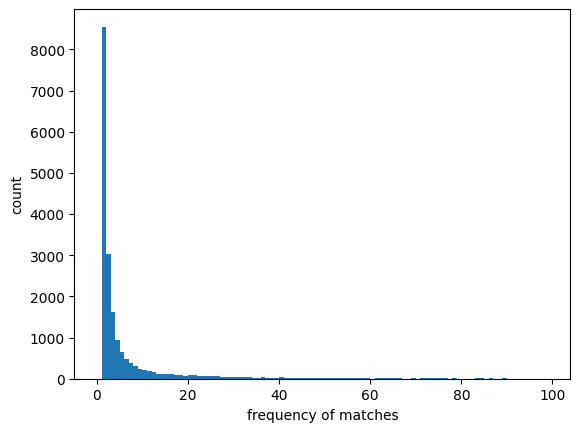

In [16]:
# plt.hist(match_count, bins = range(min(match_count),max(match_count)+1))
plt.hist(match_count, bins = range(0,100))
plt.xlabel('frequency of matches'), plt.ylabel('count')
plt.show()

look on bvr website to see if PUL

### investigate correlation between matches in one contig to other matches in the same neighbourhood:

define neighbourhood to be 10 consecutive ORFs?

think about how to do this...

______

Idea:
Represent the matches and non-matches in a contig by 1s and 0s respectively.

Define close and far: 
- Two matches are "far apart" if they are $\geq M$, and "close"/"connected" if $\leq N$ apart. 
- Notion of closeness is quantified using a measure of distance/dissimilarity; need to take into account position, distance from end(?), length of PUL, etc

Define "cluster":
- Fix N. if d(a,c) < N, connect E(a,b). The cluster is the closure of edges E.

Look for clusters:
- Instead of looking at a fixed neighbourhood and then identifying matches within the neighbourhood, we will treat neighbourhoods as transitive, and consider a cluster as the number (or some metric that considers the number) of connected matches.

Analyse clusters:
- Number of clusters in each PUL, sistance between clusters, length/radius of cluster
- Within each cluster: number of matches, distance between matches
- alter notion of "close" and "far" accordingly

Notion of closeness is quantified using a measure of distance (or dissimilarity)

In [ ]:
# bin_subcat =  #array of arrays; stores 1 if match, 0 if non-match


#id_array_all and id_list are the same?

In [17]:
contig_ids = [] #contains list of contig IDs
for x in subcat:
    x_cat = x[0].split('_')[0]
    contig_ids.append(x_cat)


In [18]:
flat_subcat = []
for x in subcat:
    flat_subcat.extend(x)

In [19]:
matches_01 = []
for x in range(len(subcat)): #append N empty lists to matches_01
    matches_01.append([])

# matches_01 = [[] for x in subcat]
print('1 ok')

num_array = [int(y.split('_')[1]) for y in id_list] #orf numbers
id_count_rev = [y.split('_')[0] for y in id_list]
id_count_rev = id_count_rev[::-1] #since index only takes the first occurrence
max_orf = []
for x in contig_ids:
    ind = len(id_count_rev)-1 - id_count_rev.index(x)
    max_orf.append(num_array[ind])

for i in range(len(max_orf)):
    for j in range(max_orf[i]):
        matches_01[i].append(0)

print('2 ok')

for x in flat_subcat: #use list of matches instead (flat_subcat)
    x1 = x.split('_')
    index=contig_ids.index(x1[0])
    if int(x1[1]) > len(matches_01[index]):
        matches_01[index].extend(np.ones(int(x1[1]) - len(matches_01[index]),))
    else:
        matches_01[index][int(x1[1])-1] = 1 #insert 1 if a match  

# takes ~3 min
# '1 ok': ~1 s
# '2 ok': ~2 min
# remember that contig ids count from 1, python indexing counts from 0

1 ok
2 ok


sum of `testarray` is zero, so `matches_01` is correct according to our diamond output (assuming that no matches have been missed out):

In [20]:
b = [len(matches_01[i]) for i in range(len(matches_01))]
testarray=np.array(b) - np.array(max_orf)
sum(testarray)

0

problem: contig_ids and id_count_array lists the contig ids in a different order

A check: array of sum of number of matches recorded in each contig in `matches_01` should be equal to that of `subcat`:

In [21]:
sum_matches_array = [sum(matches_01[i]) for i in range(len(matches_01))]
sum_subcat = [len(subcat[i]) for i in range(len(subcat))]
sum_subcat == sum_matches_array

True

### 1. Number of matches in each contig:
- relative to length of contig
- 

In [22]:
#not sure what this does

temparray=[]
max_ind_array = []
for x in subcat:
    temparray = [int(y.split('_')[1]) for y in x]
    max_ind_array.append(max(temparray))

In [23]:
len_matches_array = [len(matches_01[i]) for i in range(len(matches_01))]

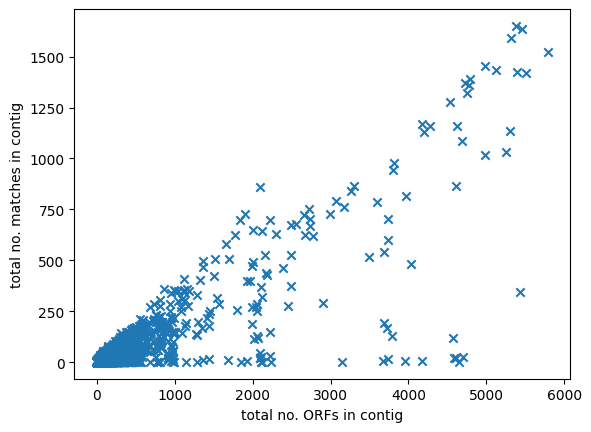

In [24]:
plt.scatter(len_matches_array, sum_matches_array,marker='x')
plt.xlabel('total no. ORFs in contig')
plt.ylabel('total no. matches in contig')
plt.show()

Visualisation of matches in a chosen contig:

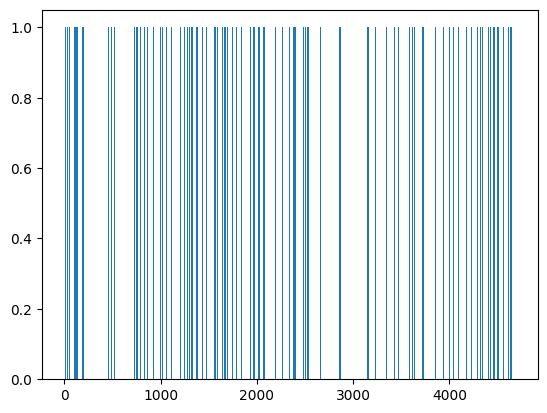

In [25]:
x = matches_01[25]
plt.bar(np.arange(len(x)),x)
plt.show()

# < 15 s

### 2. Program to count no. clusters in each contig:

Result: we will have the following information:
- length of contig (ie total number of ORFs in contig)
- no. matches (1s) / non-matches (0s)
- no. clusters

Drawback: this may not differentiate between e.g. a contig containing clusters all of a consistent medium size vs a contig containing one large cluster and remaining small ones.

Solution: plot a graph of clusters vs N

count cluster size

In [46]:
# no. clusters = no. subseqs of 0 of length >= N+1 (or +1 if seq starts and ends with 1s, or -1 if seq starts and ends with 0s). call these anti-clusters
def clustercount(N,contig): #N is int, contig is array or list of matches (1s and 0s only)
    count = 0 # no. clusters
    if sum(contig) == len(contig): # ie all 1s
        count = 1
    else:
        start = contig.index(0)
        ind = start
        temp = contig[:]
        temp.extend([1 for i in range(N)]) # Q: why does this extend contig as well?
        temp.append(0)
        # print('contig: ',contig)
        # print('extended contig: ',temp)
        # print('start: ',start)
        while ind in range(start,len(contig)):
            if sum(temp[ind:ind+N]) == 0:
                count +=1 #syntax? #register one cluster
                # print('y')
                # print('ind: ',ind)
                ind = temp[ind+N:].index(1) + ind+N #finds next 1
                # print('ind: ',ind)
                ind = temp[ind+1:].index(0) + ind+1 #finds first 0 following the 1
                # print('ind: ',ind)
            else:
                # print('n')
                # print('ind: ',ind)
                ind = temp[ind+1:].index(1) + ind+1 #finds next 1
                # print('ind: ',ind)
                ind = temp[ind+1:].index(0) + ind+1 #finds first 0 following the 1
                # print('ind: ',ind)
            # print('count: ',count)
        if sum(temp[0:N]) > 0 and sum(temp[-2*N -1:-N-1]) > 0: # ie seq starts & ends with clusters
            # print('1 start end')
            count +=1
        elif sum(temp[0:N]) == 0 and sum(temp[-2*N -1:-N-1]) == 0: #ie seq starts & ends with anticlusters
            # print('0 start end')
            count -=1
        elif count == 0 and sum(contig) > 0: #account for fact that this func only counts anticontigs
            # print('one contig, zero anticontigs')
            count +=1
        # else:
            # print('neither')
    return count

#eg: '11' is distance 1;


In [47]:
matches_01[52]

[1]

In [117]:
test = matches_01[10][:]
clustercount(100,test)

1

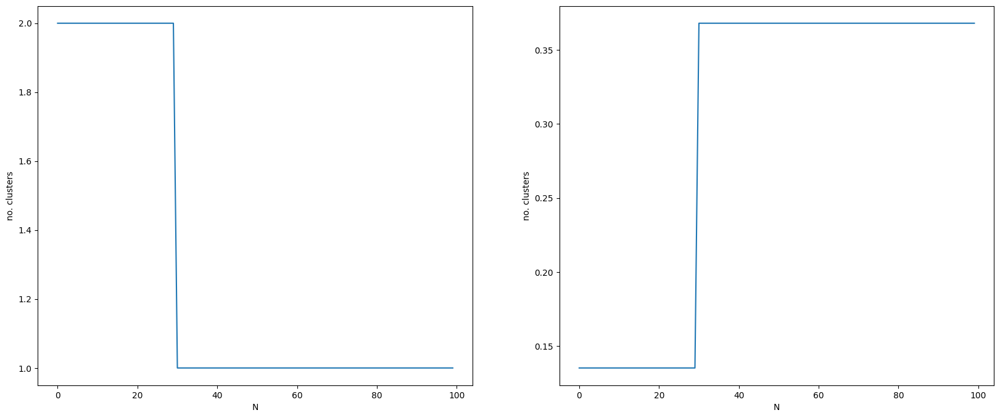

In [212]:
k=19096
contig = matches_01[k][:]
X, y = [], []
X.append(0), y.append(sum(matches_01[k]))
for N in range(1,100):
    y.append(clustercount(N,contig))
    X.append(N)

plt.figure(figsize=(20, 8))
plt.subplot(1,2,1)
plt.plot(X,y, label='original')
plt.xlabel('N')
plt.ylabel('no. clusters')


y_new = [np.exp(-a) for a in y]
# y_new = [1/a for a in y]
plt.subplot(1,2,2)
plt.plot(X,y_new, label='new')
# plt.ylim(-100,)
plt.xlabel('N')
plt.ylabel('no. clusters')



plt.show()

no. clusters vs avg cluster size

The first plot above displays the number of clusters against N; in the second plot we try to alter the y-values of the first plot to find the type of curve it is

Notes:
- single straight line through 1 (e.g. k=7000) represents one match in whole contig 
- downward step function at x (e.g. k=1000) suggests one cluster is of size x 
- negative exponential(??) (e.g. k=1,10) cluster sizes evenly distributed?
    - k=10: looked like logarithmic/exponential? But disproved using plot above.

investigate mixing!!!

look online for a tool to fit the graph above, since we can't identify it

consider length of contig

consider size of cluster; define size

bvr website; see how many of the classes are represented in each cluster eg susc, susd, cbms etc

### Overlaying the above for different contigs:

0
1
2
3
4
5
6
7
8
9


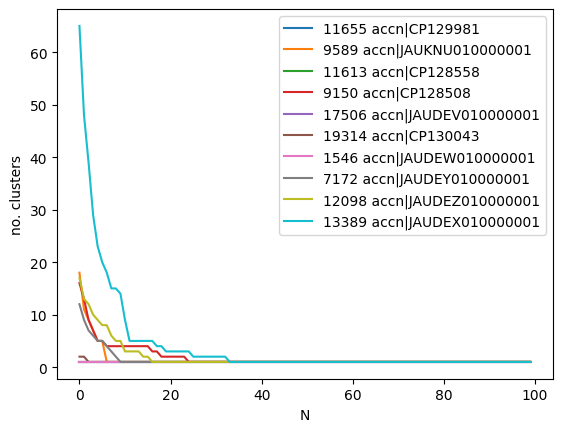

In [213]:
# lst = range(10) #or randsample from range(len(matches_01))?
lst = random.sample(range(len(matches_01)),10)
X, y = [], []

for i in range(len(lst)):
    print(i)
    contig = matches_01[lst[i]][:]
    X.append([]), y.append([])
    X[i].append(0), y[i].append(sum(matches_01[lst[i]]))
    for N in range(1,100):
        y[i].append(clustercount(N,contig)), X[i].append(N)
    plt.plot(X[i],y[i], label=str(lst[i])+' '+contig_ids[i]) #str(lst[[i]]))

    # plt.plot(X,y)
plt.legend(loc='upper right')
plt.xlabel('N')
plt.ylabel('no. clusters')
plt.show()

Now fix N; plot bar chart of no. clusters against contig

Another idea: (& more relevant to the original q) Investigate sizes of contigs;

Consider contig 0 (matches_01[0]):



In [40]:
k=0
n=3
contig=matches_01[k][:]
print('contig: ',k,' ',contig_ids[k])
print('length of contig: ', len(matches_01[k]))
print('no. matches: ', sum(matches_01[k]))
print('no. clusters: ', clustercount(n,contig))
#can also add dist of sizes of clusters?


contig:  0   accn|CP129981
length of contig:  5457
no. matches:  1634
no. clusters:  485


Construct Dataframe to store cluster data:

In [155]:
a=contig_ids
b=[] #contig length
c=[] #no. matches
d,e,f,g=[],[],[],[] #no. clusters, for fixed N
N=[1, 2, 5, 10]
# N=2
for i in range(len(contig_ids)):
    b.append(len(matches_01[i]))
    c.append(sum(matches_01[i]))
    d.append(clustercount(N[0],matches_01[i][:])), e.append(clustercount(N[1],matches_01[i][:])), f.append(clustercount(N[2],matches_01[i][:])), g.append(clustercount(N[3],matches_01[i][:]))

data = {'contig id': a,
        'contig length': b,
        'no. matches': c,
        'no. clusters, N='+str(N[0]): d,
        'no. clusters, N='+str(N[1]): e,
        'no. clusters, N='+str(N[2]): f,
        'no. clusters, N='+str(N[3]): g}
cluster_df = pd.DataFrame(data)

In [133]:
cluster_df

,contig id,contig length,no. matches,"no. clusters, N=1","no. clusters, N=2","no. clusters, N=5","no. clusters, N=10"
0,accn|CP129981,5457,1634,899,636,285,72
1,accn|JAUKNU010000001,5790,1522,1011,729,333,101
2,accn|CP128558,5312,1592,900,629,273,81
3,accn|CP128508,5515,1422,841,610,299,108
4,accn|JAUDEV010000001,5429,346,253,224,166,101
...,...,...,...,...,...,...,...
19322,accn|CASUGI010000248,3,1,1,1,1,1
19323,accn|JAKEBI010000359,3,1,1,1,1,1
19324,accn|JAUNNL010000200,1,1,1,1,1,1
19325,accn|JAKDRO010000283,1,1,1,1,1,1


histograph of no. clusters (0-10) across ALL contigs

redefine 'match'; eg >2 matches in same contig to same PUL

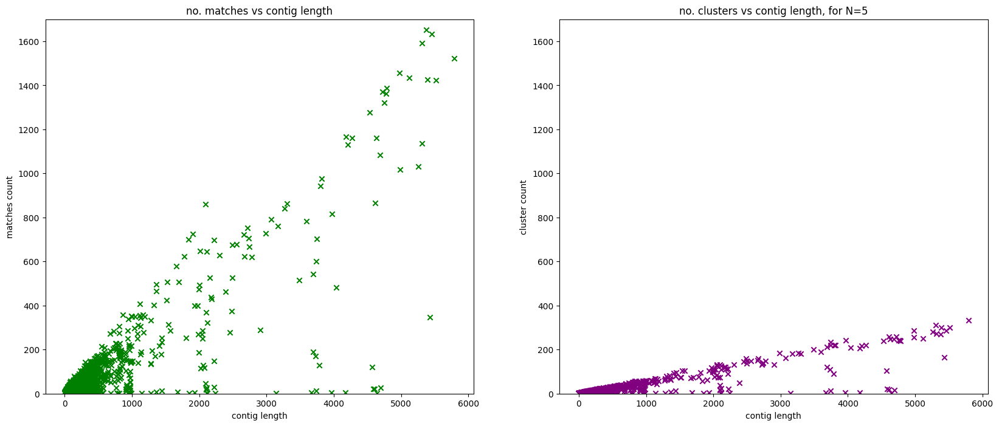

In [159]:
#plot of matches & clusters vs contig length:
plt.figure(figsize=(20, 8))
i=2 #

plt.subplot(1,2,1)
plt.scatter(cluster_df.iloc[:,1], cluster_df.iloc[:,2], marker='x', label='no. matches',color='green')
plt.ylim(0,1700)
plt.title('no. matches vs contig length')
plt.xlabel('contig length'), plt.ylabel('matches count')

plt.subplot(1,2,2)
plt.scatter(cluster_df.iloc[:,1], cluster_df.iloc[:,3+i], marker='x', label='no. clusters, N='+str(N[i]),color='purple')
plt.ylim(0,1700)
plt.title('no. clusters vs contig length, for N='+str(N[i]))
plt.xlabel('contig length'), plt.ylabel('cluster count')

# plt.legend(loc='upper left')
plt.show()

colour by taxa; use ggplot

From the plot above (matches & clusters vs contig length, for N=2):
- Dense for contig length 0-1000
- Both dependent variables show some positive correlation with contig length, approx linearly proportional?
- Many contigs with 
- A number of contigs with very few clusters but many more matches - (good), suggests there may be corr between contig 
    - score and exclude 'bad' contigs using some theshold? eg $s = \frac{\text{no. matches} - \text{no. clusters}}{\text{no. matches}}\ >\ x$,  for e.g. $x=\frac{1}{3}$ (see below)
    - 'avg cluster size'
    - score dependent on N?
    - hypothesis test: null: matches are randomly assigned
    - hyp test: dist of PUL labels across clusters are random?
    
- As N is increased, the second plot becomes less steep
    

(Text(0, 0.5, 'no. clusters/no. matches'),
 Text(0.5, 0, 'contig length'),
 Text(0.5, 1.0, 'no.clusters/no. matches against contig length'))

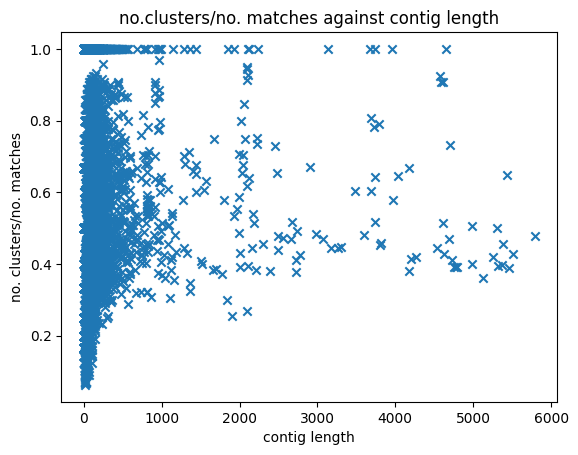

In [189]:
cluster_frac=[cluster_df.iloc[i,4]/cluster_df.iloc[i,2] for i in range(len(contig_ids))]

plt.scatter(cluster_df.iloc[:,1], cluster_frac, marker='x', label='no. clusters/no. matches, N='+str(N[1]))
plt.ylabel('no. clusters/no. matches'), plt.xlabel('contig length'), plt.title('no.clusters/no. matches against contig length')

# plt.rcParams['text.usetex'] = True
# plt.rcParams['text.latex.preamble'] = [r'\usepackage{amsmath}']
# plt.title(r"$\frac{\mathrm{no.\ clusters}}{\mathrm{no.\ matches}} \mathrm{\ vs\ contig\ length}$")
# plt.rcParams['text.usetex'] = False



(Text(0.5, 0, 'contig length'), Text(0, 0.5, 'no. clusters/no. matches'))

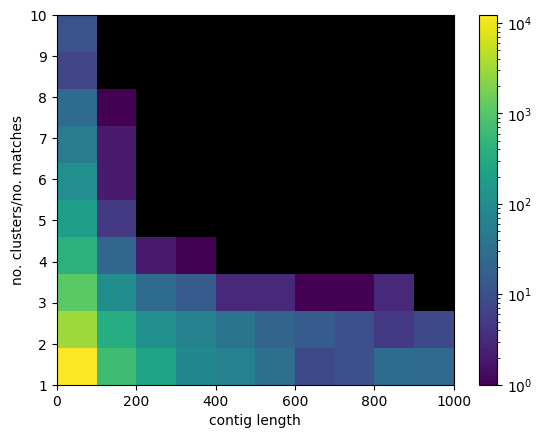

In [218]:
fig, ax = plt.subplots()
cluster_frac1 = [1/a for a in cluster_frac]
counts, xedges, yedges, im = ax.hist2d(cluster_df.iloc[:,1], cluster_frac1, bins=10, range=[[0,1000], [1,10]], norm=LogNorm())#, norm=LogNorm(), range=[[0,1.2],[-800,0]])
fig.colorbar(im)
ax.set_facecolor((0, 0, 0))

plt.xlabel('contig length'), plt.ylabel('no. matches/no clusters')


histogram of cluster LENGTH vs contig length, etc

- idea: can also count singleton matches?  

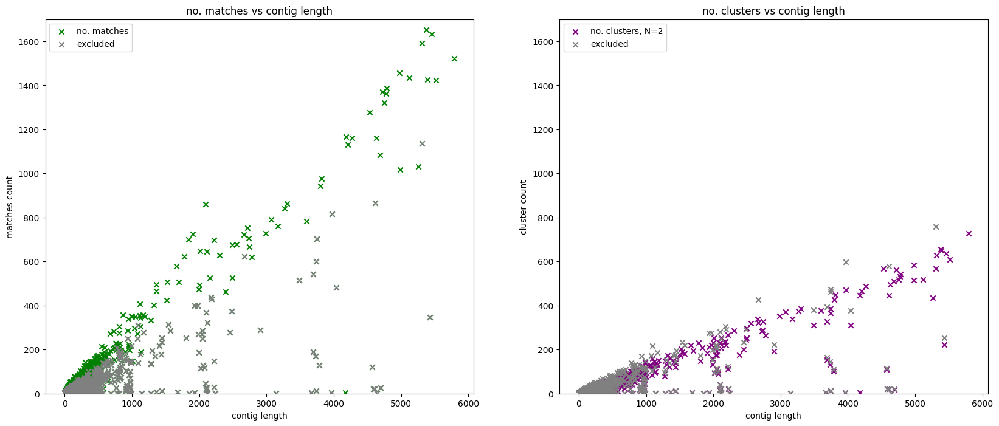

In [99]:
n=1 #value between 0-3

excl=[[],[],[]]
excl_ind=[]
l=cluster_df.iloc[:,1]
m=cluster_df.iloc[:,2]
c=cluster_df.iloc[:,3]
for i in range(len(contig_ids)):
    # print('score = ',(m[i]-c[i])/m[i],'_', 'contig len = ',l[i],' ', 'matches = ',m[i],' ', 'clusters = ', c[i])
    if (m[i]-c[i])/m[i] < 1/3:
        excl[0].append(l[i]), excl[1].append(m[i]), excl[2].append(c[i])
        excl_ind.append(1)
    else:
        excl_ind.append(0)

plt.figure(figsize=(20, 8))

plt.subplot(1,2,1)
plt.scatter(cluster_df.iloc[:,1], cluster_df.iloc[:,2], marker='x', label='no. matches',color='green')
plt.scatter(excl[0],excl[1],marker='x',color='gray',label='excluded')
plt.ylim(0,1700)
plt.title('no. matches vs contig length')
plt.legend(loc='upper left')
plt.xlabel('contig length'), plt.ylabel('matches count')

plt.subplot(1,2,2)
plt.scatter(cluster_df.iloc[:,1], cluster_df.iloc[:,3+n], marker='x', label='no. clusters, N='+str(N[n]),color='purple')
plt.scatter(excl[0],excl[2],marker='x',color='gray',label='excluded')
plt.ylim(0,1700)
plt.title('no. clusters vs contig length')
plt.legend(loc='upper left')
plt.xlabel('contig length'), plt.ylabel('cluster count')

# plt.legend(loc='upper left')
plt.show()

In [ ]:
excl_ind

In [135]:
cluster_df['excl']=excl_ind

In [136]:
cluster_df

,contig id,contig length,no. matches,"no. clusters, N=1","no. clusters, N=2","no. clusters, N=5","no. clusters, N=10",excl
0,accn|CP129981,5457,1634,899,636,285,72,0
1,accn|JAUKNU010000001,5790,1522,1011,729,333,101,0
2,accn|CP128558,5312,1592,900,629,273,81,0
3,accn|CP128508,5515,1422,841,610,299,108,0
4,accn|JAUDEV010000001,5429,346,253,224,166,101,1
...,...,...,...,...,...,...,...,...
19322,accn|CASUGI010000248,3,1,1,1,1,1,1
19323,accn|JAKEBI010000359,3,1,1,1,1,1,1
19324,accn|JAUNNL010000200,1,1,1,1,1,1,1
19325,accn|JAKDRO010000283,1,1,1,1,1,1,1
